<a href="https://colab.research.google.com/github/flydragon2018/colab_notebooks/blob/main/FaceSwap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FaceSwap

<img src="https://drive.google.com/uc?export=view&id=1MdOWxP9CqyqmW6t9MQ6-gcfEux54zbqP">

In [1]:
#@markdown #**セットアップ**

# Clone github
!git clone https://github.com/cedro3/sber-swap.git
%cd sber-swap

# load arcface
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
!wget -P ./arcface_model https://github.com/sberbank-ai/sber-swap/releases/download/arcface/iresnet.py

# load landmarks detector
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/glintr100.onnx
!wget -P ./insightface_func/models/antelope https://github.com/sberbank-ai/sber-swap/releases/download/antelope/scrfd_10g_bnkps.onnx

# load model itself
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/sber-swap-v2.0/G_unet_2blocks.pth

# load super res model
!wget -P ./weights https://github.com/sberbank-ai/sber-swap/releases/download/super-res/10_net_G.pth

# Install required libraries
!pip install mxnet-cu112
!pip install onnxruntime-gpu==1.12
!pip install insightface==0.2.1
!pip install kornia==0.5.4
!pip install dill

!rm /usr/local/lib/python3.10/dist-packages/insightface/model_zoo/model_zoo.py #change the path to python in case you use a different version
!wget -P /usr/local/lib/python3.10/dist-packages/insightface/model_zoo/ https://github.com/AlexanderGroshev/insightface/releases/download/model_zoo/model_zoo.py #change the path to python in case you use a different version

# library import
import cv2
import torch
import time
import os
from utils.inference.image_processing import crop_face, get_final_image, show_images
from utils.inference.video_processing import read_video, get_target, get_final_video, add_audio_from_another_video, face_enhancement
from utils.inference.core import model_inference
from network.AEI_Net import AEI_Net
from coordinate_reg.image_infer import Handler
from insightface_func.face_detect_crop_multi import Face_detect_crop
from arcface_model.iresnet import iresnet100
from models.pix2pix_model import Pix2PixModel
from models.config_sr import TestOptions


# --- Initialize models ---
app = Face_detect_crop(name='antelope', root='./insightface_func/models')
app.prepare(ctx_id= 0, det_thresh=0.6, det_size=(640,640))

# main model for generation
G = AEI_Net(backbone='unet', num_blocks=2, c_id=512)
G.eval()
G.load_state_dict(torch.load('weights/G_unet_2blocks.pth', map_location=torch.device('cpu')))
G = G.cuda()
G = G.half()

# arcface model to get face embedding
netArc = iresnet100(fp16=False)
netArc.load_state_dict(torch.load('arcface_model/backbone.pth'))
netArc=netArc.cuda()
netArc.eval()

# model to get face landmarks
handler = Handler('./coordinate_reg/model/2d106det', 0, ctx_id=0, det_size=640)

# model to make superres of face, set use_sr=True if you want to use super resolution or use_sr=False if you don't
use_sr = True
if use_sr:
    os.environ['CUDA_VISIBLE_DEVICES'] = '0'
    torch.backends.cudnn.benchmark = True
    opt = TestOptions()
    #opt.which_epoch ='10_7'
    model = Pix2PixModel(opt)
    model.netG.train()

Cloning into 'sber-swap'...
remote: Enumerating objects: 700, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 700 (delta 2), reused 1 (delta 0), pack-reused 694
Receiving objects: 100% (700/700), 94.79 MiB | 14.05 MiB/s, done.
Resolving deltas: 100% (165/165), done.
/content/sber-swap
--2023-07-28 07:52:00--  https://github.com/sberbank-ai/sber-swap/releases/download/arcface/backbone.pth
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/ai-forever/ghost/releases/download/arcface/backbone.pth [following]
--2023-07-28 07:52:00--  https://github.com/ai-forever/ghost/releases/download/arcface/backbone.pth
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/github-production-

/usr/local/lib/python3.10/dist-packages/kornia/augmentation/augmentation.py:1830: DeprecationWarning: GaussianBlur is no longer maintained and will be removed from the future versions. Please use RandomGaussianBlur instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/mxnet/numpy/utils.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bool = onp.bool
/usr/local/lib/python3.10/dist-packages/mxnet/numpy/fallback.py:143: DeprecationWarning: In accordance with NEP 32, the function mirr was removed from NumPy version 1.20.  A replacement for this function is available in the numpy_financial library: https://pypi.org/project/numpy-financial
  mirr = onp.mirr

input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)
loading ./coordinate_reg/model/2d106det 0
input mean and std: 127.5 127.5
find model: ./insightface_func/models/antelope/glintr100.onnx recognition
find model: ./insightface_func/models/antelope/scrfd_10g_bnkps.onnx detection
set det-size: (640, 640)
Network [LIPSPADEGenerator] was created. Total number of parameters: 72.2 million. To see the architecture, do print(network).
Load checkpoint from path:  weights/10_net_G.pth


In [2]:
#@title #**画像をFaceswap**
#@markdown ・自分の画像は examples/images にアップロードして下さい
source = 'nanako.jpg' #@param {type:"string"}
target = 'satomi.jpg' #@param {type:"string"}
source_path = 'examples/images/'+source
target_path = 'examples/images/' + target

source_full = cv2.imread(source_path)
crop_size = 224 # don't change this
batch_size =  40

source = crop_face(source_full, app, crop_size)[0]
source = [source[:, :, ::-1]]

target_full = cv2.imread(target_path)
full_frames = [target_full]
target = get_target(full_frames, app, crop_size)

final_frames_list, crop_frames_list, full_frames, tfm_array_list = model_inference(full_frames,
                                                                                   source,
                                                                                   target,
                                                                                   netArc,
                                                                                   G,
                                                                                   app,
                                                                                   set_target = False,
                                                                                   crop_size=crop_size,
                                                                                   BS=batch_size)

result = get_final_image(final_frames_list, crop_frames_list, full_frames[0], tfm_array_list, handler)
cv2.imwrite('examples/results/result.png', result)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 1/1 [00:00<00:00, 49.60it/s]
1it [00:00, 810.81it/s]
100%|██████████| 1/1 [00:00<00:00, 1786.33it/s]
/usr/local/lib/python3.10/dist-packages/mxnet/ndarray/utils.py:141: DeprecationWarning: Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is deprecated.
  if spsp is not None and isinstance(source_array, spsp.csr.csr_matrix):
/usr/local/lib/python3.10/dist-packages/mxnet/ndarray/utils.py:141: DeprecationWarning: Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is deprecated.
  if spsp is not None and isinstance(source_array, spsp.csr.csr_

True

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


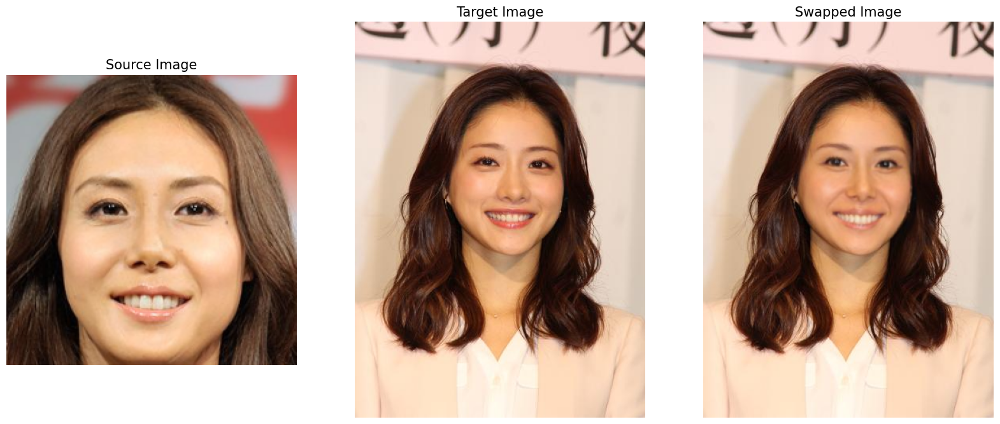

In [3]:
#@markdown #**画像を表示**
#@markdown ・画像は examples/results/results.png に保存されています
import matplotlib.pyplot as plt

show_images([source[0][:, :, ::-1], target_full, result], ['Source Image', 'Target Image', 'Swapped Image'], figsize=(20, 15))

In [4]:
#@title #**動画をFaceswap**
#@markdown ・自分の画像は examples/images にアップロードして下さい\
#@markdown ・自分の動画は examples/videos にアップロードして下さい
source = 'angelina.jpg' #@param {type:"string"}
video = 'yui.mp4' #@param {type:"string"}
source_path = 'examples/images/'+source
path_to_video = 'examples/videos/'+video

source_full = cv2.imread(source_path)
OUT_VIDEO_NAME = "examples/results/result.mp4"
crop_size = 224 # don't change this
batch_size =  40

source = crop_face(source_full, app, crop_size)[0]
source = [source[:, :, ::-1]]

full_frames, fps = read_video(path_to_video)
target = get_target(full_frames, app, crop_size)

START_TIME = time.time()

final_frames_list, crop_frames_list, full_frames, tfm_array_list = model_inference(full_frames,
                                                                                   source,
                                                                                   target,
                                                                                   netArc,
                                                                                   G,
                                                                                   app,
                                                                                   set_target = False,
                                                                                   crop_size=crop_size,
                                                                                   BS=batch_size)

if use_sr:
    final_frames_list = face_enhancement(final_frames_list, model)

get_final_video(final_frames_list,
                crop_frames_list,
                full_frames,
                tfm_array_list,
                OUT_VIDEO_NAME,
                fps,
                handler)

add_audio_from_another_video(path_to_video, OUT_VIDEO_NAME, "audio")

print(f'Full pipeline took {time.time() - START_TIME}')
print(f"Video saved with path {OUT_VIDEO_NAME}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 439/439 [00:06<00:00, 71.03it/s]
439it [00:00, 4123.55it/s]
100%|██████████| 439/439 [00:00<00:00, 487761.45it/s]
22it [00:37,  1.68s/it]
  0%|          | 0/439 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/mxnet/ndarray/utils.py:141: DeprecationWarning: Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is deprecated.
  if spsp is not None and isinstance(source_array, spsp.csr.csr_matrix):
/usr/local/lib/python3.10/dist-packages/mxnet/ndarray/utils.py:141: DeprecationWarning: Please use `csr_matrix` from the `scipy.sparse` namespace, the `scipy.sparse.csr` namespace is 

Full pipeline took 84.40605974197388
Video saved with path examples/results/result.mp4


In [5]:
#@markdown #**動画を表示**
#@markdown ・動画は examples/results/results.mp4 に保存されています
from IPython.display import HTML
from base64 import b64encode

video_file = open(OUT_VIDEO_NAME, "r+b").read()
video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"

HTML(f"""<video width={800} controls><source src="{video_url}"></video>""")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
